# Oil Spill Detection from Sentinel-1 Data

***
- This project aims to detect oil spills from Sentinel-1 Synthetic Aperture Radar (SAR) images using a **Conditional Generative Adversarial Network (CGAN)** with a **Seg-Net generator**. The model predicts segmentation masks highlighting oil spill regions, calculates their surface area, and identifies their geographical location.


#### References :
1. [Deep neural network for oil spill detection using Sentinel-1 data: application to Egyptian coastal regions by Samira Ahmed,Tamer ElGharbawi,Mahmoud Salah & Mahmoud El-Mewafi](https://www.tandfonline.com/doi/full/10.1080/19475705.2022.2155998#abstract)

2. [pix2pix: Image-to-image translation with a conditional GAN](https://www.tensorflow.org/tutorials/generative/pix2pix)


## Project setup and Libraries :

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Imports
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, ReLU, LeakyReLU, Dropout, Input, Concatenate
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error
from skimage.metrics import structural_similarity as ssim

## Data loading and Preprocessing :

- we used the dataset from this [paper](https://www.google.com/url?q=https%3A%2F%2Fwww.tandfonline.com%2Fdoi%2Ffull%2F10.1080%2F19475705.2022.2155998%23abstract) which consists of preprocessed raw images and Ground Truth Masks **(GTM)** and was obtained by the Sentinel-1 mission satellite level-1 Ground Range Detected (GRD), which is equipped with a C-band SAR system and distributed by the European Space Agency (ESA) via the Copernicus Open Access Hub. [1](https://www.tandfonline.com/doi/full/10.1080/19475705.2022.2155998#d1e241:~:text=The%20dataset%20mentioned,Open%20Access%20Hub.)

In [ ]:
# Function to load preprocessed data
def load_data(raw_images_path, gtm_images_path, img_size=(256, 256)):
    raw_images, gtm_images = [], []
    for img_name in os.listdir(raw_images_path):
        raw_img_path = os.path.join(raw_images_path, img_name)
        gtm_img_path = os.path.join(gtm_images_path, img_name)

        # Load raw and GTM images
        raw_img = cv2.imread(raw_img_path, cv2.IMREAD_GRAYSCALE)
        gtm_img = cv2.imread(gtm_img_path, cv2.IMREAD_GRAYSCALE)

        # Add images to lists
        raw_images.append(raw_img)
        gtm_images.append(gtm_img)

    raw_images = np.expand_dims(np.array(raw_images), axis=-1)
    gtm_images = np.expand_dims(np.array(gtm_images), axis=-1)
    return raw_images, gtm_images

In [ ]:
# Function to preprocess images (resize and normalize)
def preprocess_images(images, img_size=(256, 256)):
    processed_images = []
    for img in images:
        resized_img = cv2.resize(img, img_size)
        normalized_img = resized_img / 255.0
        processed_images.append(np.expand_dims(normalized_img, axis=-1))
    return np.array(processed_images)

In [ ]:
# Paths to images
raw_images_path = "/content/drive/MyDrive/FRBS/RSI/Raw Patches"
gtm_images_path = "/content/drive/MyDrive/FRBS/GTM/Ground Truth Mask"

# Load data
images, masks = load_data(raw_images_path, gtm_images_path)

print("Images shape:", images.shape)
print("Masks shape:", masks.shape)

Images shape: (695, 256, 256, 1)
Masks shape: (695, 256, 256, 1)


In [ ]:
# 2. Data Augmentation (horizontal and vertical flips)
def data_augmentation(image, mask):
    if tf.random.uniform(()) > 0.5:
        image, mask = tf.image.flip_left_right(image), tf.image.flip_left_right(mask)
    if tf.random.uniform(()) > 0.5:
        image, mask = tf.image.flip_up_down(image), tf.image.flip_up_down(mask)
    return image, mask

In [ ]:
# splitting the data
train_images, temp_images, train_masks, temp_masks = train_test_split(images, masks, test_size=0.3, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.6, random_state=42)

# Output the shapes of the datasets to verify
print("Training set:", train_images.shape, train_masks.shape)
print("Validation set:", val_images.shape, val_masks.shape)
print("Test set:", test_images.shape, test_masks.shape)

Training set: (486, 256, 256, 1) (486, 256, 256, 1)
Validation set: (83, 256, 256, 1) (83, 256, 256, 1)
Test set: (126, 256, 256, 1) (126, 256, 256, 1)


In [ ]:
# Display sample images and masks
def display_samples(images, masks, num_samples=2):
    plt.figure(figsize=(10, 5 * num_samples))
    for i in range(num_samples):
      # display raw image
        plt.subplot(num_samples, 2, i * 2 + 1)
        plt.imshow(images[i].squeeze(), cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        # display mask image
        plt.subplot(num_samples, 2, i * 2 + 2)
        plt.imshow(masks[i].squeeze(), cmap="gray")
        plt.title("Ground Truth Mask (GTM)")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

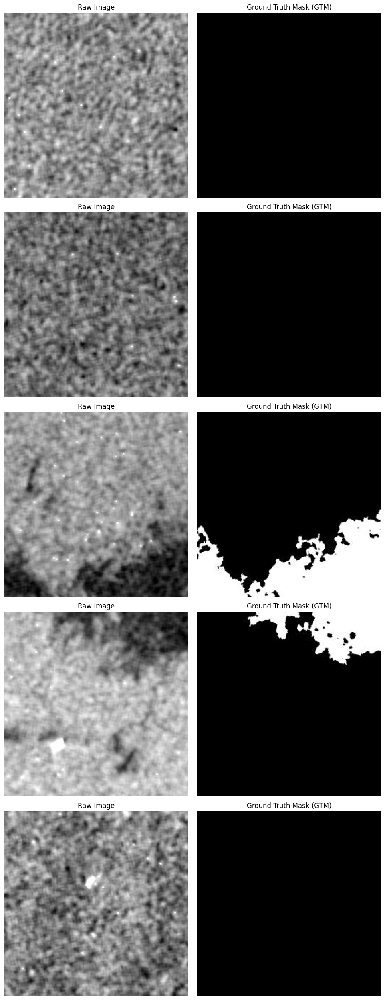

In [ ]:
display_samples(train_images, train_masks, num_samples=5)

In [ ]:
# Convert datasets to TensorFlow format

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_masks)).shuffle(100).batch(8)
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_masks)).batch(8)
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_masks)).batch(8)

In [ ]:
# Augmenting the training dataset
train_dataset = train_dataset.map(lambda x, y: data_augmentation(x, y)).prefetch(tf.data.AUTOTUNE)

## Model Architecture
We use a Conditional GAN for oil spill detection

1. The **Seg-Net generator** predicts segmentation masks highlighting oil spill regions.
2. The **Patch-GAN discriminator** distinguishes between real and generated masks, improving the generator's performance during training.

In [ ]:
# Build Seg-Net Generator
def build_generator(input_shape=(256, 256, 1)):
    inputs = Input(shape=input_shape)
    x = Conv2D(64, kernel_size=4, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(256, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(512, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    outputs = Conv2DTranspose(1, kernel_size=4, strides=2, padding='same', activation='sigmoid')(x)
    return Model(inputs, outputs, name='generator')

In [ ]:
# Build Patch-GAN Discriminator
def build_discriminator(input_shape=(256, 256, 1)):
    input_image, input_mask = Input(shape=input_shape), Input(shape=input_shape)
    x = Concatenate()([input_image, input_mask])

    x = Conv2D(64, kernel_size=4, strides=2, padding='same')(x)
    x = LeakyReLU(0.2)(x)

    x = Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Conv2D(256, kernel_size=4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Conv2D(512, kernel_size=4, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    outputs = Conv2D(1, kernel_size=4, strides=1, padding='same', activation='sigmoid')(x)
    return Model([input_image, input_mask], outputs, name='discriminator')

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 32, 32, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_4 (ReLU)                       │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 64, 64, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 5,514,113 (21.03 MB)

 Trainable params: 5,511,297 (21.02 MB)

 Non-trainable params: 2,816 (11.00 KB)

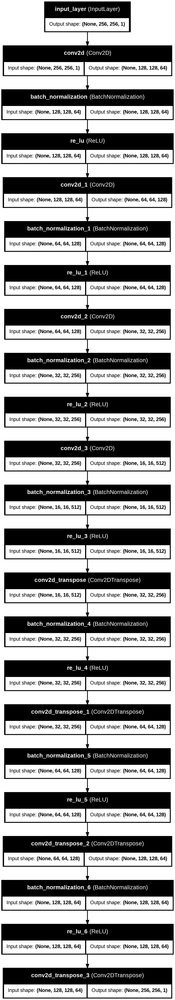

In [ ]:
# initializing the generator
generator = build_generator()

generator.summary()

tf.keras.utils.plot_model(generator, show_shapes=True, show_layer_names=True)

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 2)    │              0 │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 64)   │          2,112 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 128, 128, 64)   │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 128)    │        131,200 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 64, 64, 128)    │            512 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 32, 32, 256)    │        524,544 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 32, 32, 256)    │          1,024 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 32, 32, 256)    │              0 │ batch_normalization_8… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 32, 32, 512)    │      2,097,664 │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 32, 32, 512)    │          2,048 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 32, 32, 512)    │              0 │ batch_normalization_9… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 32, 32, 1)      │          8,193 │ leaky_re_lu_3[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,767,297 (10.56 MB)

 Trainable params: 2,765,505 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

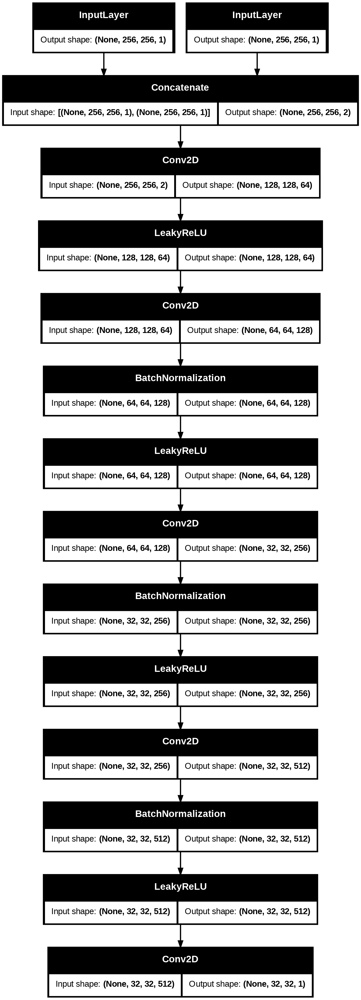

In [ ]:
# initializing the discriminator
discriminator = build_discriminator()

discriminator.summary()

tf.keras.utils.plot_model(discriminator, show_shapes=True)

## Training the Model :

In [ ]:
# if model is already trained Load the weights saved in the path
# Define the path to save the weights
weights_path = '/content/drive/MyDrive/FRBS/saved_model.weights.h5'
generator.load_weights(weights_path)
print("Weights loaded successfully. Model is ready for inference.")

Weights loaded successfully. Model is ready for inference.


In [ ]:
# Initialize optimizers
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
# Define loss functions
def generator_loss(disc_generated_output, gen_output, target):
    # Cast target to float32 to match the type of gen_output
    target = tf.cast(target, tf.float32)
    gan_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    return gan_loss + (100 * l1_loss)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)(tf.ones_like(disc_real_output), disc_real_output)
    fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)(tf.zeros_like(disc_generated_output), disc_generated_output)
    return real_loss + fake_loss


In [ ]:
# Compute Metrics
def compute_metrics(y_true, y_pred):
    metrics = {}
    y_true_flat, y_pred_flat = y_true.flatten(), y_pred.flatten()
    # Accuracy
    metrics['accuracy'] = accuracy_score(y_true_flat, y_pred_flat)

    # Precision
    metrics['precision'] = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=0)

    # Recall
    metrics['recall'] = recall_score(y_true_flat, y_pred_flat, average='macro',zero_division=0)

    # F1-score
    metrics['f1_score'] = f1_score(y_true_flat, y_pred_flat, average='macro')

    # IoU (Intersection over Union)
    intersection = np.logical_and(y_true_flat == 1, y_pred_flat == 1).sum()
    union = np.logical_or(y_true_flat == 1, y_pred_flat == 1).sum()
    metrics['iou'] = intersection / (union + 1e-6)

    # RMSE
    metrics['rmse'] = np.sqrt(mean_squared_error(y_true_flat, y_pred_flat))

    # SSIM (Structural Similarity Index) and PSNR (Peak Signal-to-Noise Ratio)
    metrics['ssim'] = ssim(y_true.squeeze(), y_pred.squeeze(), data_range=y_pred.max() - y_pred.min(),win_size=5)

    mse = mean_squared_error(y_true_flat, y_pred_flat)
    metrics['psnr'] = 20 * np.log10(1+(y_true.max() / np.sqrt(mse + 1e-4)))

    return metrics


In [ ]:
@tf.function
def train_step(generator, discriminator, input_image, target, generator_optimizer, discriminator_optimizer):
    # Calculate the gradients of generator and discriminator
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        # Get the outputs from the discriminator for real and generated images
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # Calculate the loss for both the generator and discriminator
        gen_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Compute gradients for both generator and discriminator
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradients to update the model weights
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, gen_output

In [ ]:
# Initialize dictionaries to store metrics for plotting
train_metrics = {
        'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [],
        'iou': [], 'rmse': [], 'ssim': [], 'psnr': []
    }

In [ ]:
# train function
def train(train_dataset, generator, discriminator, epochs):

    for epoch in range(epochs):
        print(f'Epoch {epoch + 1}/{epochs}')

        # Training phase
        epoch_train_gen_loss, epoch_train_disc_loss = 0, 0
        epoch_train_metrics = {k: [] for k in train_metrics.keys()}
        for input_image, target in train_dataset:
            gen_loss, disc_loss, gen_output = train_step(generator, discriminator, input_image, target, generator_optimizer, discriminator_optimizer)
            epoch_train_gen_loss += gen_loss
            epoch_train_disc_loss += disc_loss

            # Calculate metrics on the training batch
            train_metrics_batch = compute_metrics(target.numpy().squeeze(), tf.round(gen_output).numpy().squeeze())
            for key, value in train_metrics_batch.items():
                epoch_train_metrics[key].append(value)

        # Average training metrics for the epoch
        for key in train_metrics.keys():
            train_metrics[key].append(np.mean(epoch_train_metrics[key]))

        # Print training loss
        print(f"Train Generator Loss: {epoch_train_gen_loss / len(train_dataset):.4f}, Train Discriminator Loss: {epoch_train_disc_loss / len(train_dataset):.4f}")

In [ ]:
# Function to plot training and validation metrics
def plot_metrics(train_metrics, epochs):
    epochs_range = range(1, epochs + 1)

    plt.figure(figsize=(20, 12))
    metric_names = ['accuracy', 'precision', 'recall', 'f1_score', 'iou', 'rmse', 'ssim', 'psnr']
    for i, metric in enumerate(metric_names, 1):
        plt.subplot(2, 4, i)
        plt.plot(epochs_range, train_metrics[metric], label=f"Train {metric.capitalize()}", marker='o')
        plt.xlabel("Epochs")
        plt.ylabel(metric.capitalize())
        plt.title(f"{metric.capitalize()} Over Epochs")
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
# Run the training with metrics tracking
train(train_dataset, generator, discriminator, epochs=50)

Epoch 1/50
Train Generator Loss: 1867.3286, Train Discriminator Loss: 0.3337
Epoch 2/50
Train Generator Loss: 1863.5643, Train Discriminator Loss: 0.0306
Epoch 3/50
Train Generator Loss: 1865.7649, Train Discriminator Loss: 0.2147
Epoch 4/50
Train Generator Loss: 1868.1212, Train Discriminator Loss: 0.1918
Epoch 5/50
Train Generator Loss: 1872.2753, Train Discriminator Loss: 0.0997
Epoch 6/50
Train Generator Loss: 1867.3209, Train Discriminator Loss: 0.1198
Epoch 7/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1868.6907, Train Discriminator Loss: 0.1148
Epoch 8/50
Train Generator Loss: 1868.0388, Train Discriminator Loss: 0.1105
Epoch 9/50
Train Generator Loss: 1884.6935, Train Discriminator Loss: 0.0798
Epoch 10/50
Train Generator Loss: 1865.2806, Train Discriminator Loss: 0.1076
Epoch 11/50
Train Generator Loss: 1880.5000, Train Discriminator Loss: 0.0082
Epoch 12/50
Train Generator Loss: 1871.8018, Train Discriminator Loss: 0.0054
Epoch 13/50
Train Generator Loss: 1871.1416, Train Discriminator Loss: 0.0071
Epoch 14/50
Train Generator Loss: 1866.2345, Train Discriminator Loss: 0.1065
Epoch 15/50
Train Generator Loss: 1889.0364, Train Discriminator Loss: 0.0074
Epoch 16/50
Train Generator Loss: 1880.1699, Train Discriminator Loss: 0.1113
Epoch 17/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1869.7552, Train Discriminator Loss: 0.2688
Epoch 18/50
Train Generator Loss: 1863.6615, Train Discriminator Loss: 0.0988
Epoch 19/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1862.7771, Train Discriminator Loss: 0.1813
Epoch 20/50
Train Generator Loss: 1863.3744, Train Discriminator Loss: 0.1460
Epoch 21/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1874.6630, Train Discriminator Loss: 0.0922
Epoch 22/50
Train Generator Loss: 1874.0098, Train Discriminator Loss: 0.0113
Epoch 23/50
Train Generator Loss: 1866.5587, Train Discriminator Loss: 0.0047
Epoch 24/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1865.5751, Train Discriminator Loss: 0.0964
Epoch 25/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1880.4116, Train Discriminator Loss: 0.0950
Epoch 26/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1868.0291, Train Discriminator Loss: 0.1535
Epoch 27/50
Train Generator Loss: 1878.6814, Train Discriminator Loss: 0.0138
Epoch 28/50
Train Generator Loss: 1865.8191, Train Discriminator Loss: 0.0042
Epoch 29/50
Train Generator Loss: 1872.6075, Train Discriminator Loss: 0.1537
Epoch 30/50
Train Generator Loss: 1882.8960, Train Discriminator Loss: 0.0752
Epoch 31/50
Train Generator Loss: 1864.6332, Train Discriminator Loss: 0.0808
Epoch 32/50
Train Generator Loss: 1883.9175, Train Discriminator Loss: 0.0816
Epoch 33/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1872.4940, Train Discriminator Loss: 0.0966
Epoch 34/50
Train Generator Loss: 1886.8470, Train Discriminator Loss: 0.0060
Epoch 35/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1866.0317, Train Discriminator Loss: 0.0781
Epoch 36/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1880.2192, Train Discriminator Loss: 0.1305
Epoch 37/50
Train Generator Loss: 1870.5402, Train Discriminator Loss: 0.0574
Epoch 38/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1874.4034, Train Discriminator Loss: 0.2225
Epoch 39/50
Train Generator Loss: 1866.1486, Train Discriminator Loss: 0.1114
Epoch 40/50
Train Generator Loss: 1871.8782, Train Discriminator Loss: 0.0892
Epoch 41/50
Train Generator Loss: 1873.8972, Train Discriminator Loss: 0.0253
Epoch 42/50
Train Generator Loss: 1864.3523, Train Discriminator Loss: 0.1331
Epoch 43/50
Train Generator Loss: 1864.8221, Train Discriminator Loss: 0.0278
Epoch 44/50
Train Generator Loss: 1894.7318, Train Discriminator Loss: 0.0842
Epoch 45/50
Train Generator Loss: 1864.6115, Train Discriminator Loss: 0.0108
Epoch 46/50
Train Generator Loss: 1875.3292, Train Discriminator Loss: 0.0040
Epoch 47/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1873.6021, Train Discriminator Loss: 0.0868
Epoch 48/50
Train Generator Loss: 1876.5153, Train Discriminator Loss: 0.0386
Epoch 49/50
Train Generator Loss: 1869.9828, Train Discriminator Loss: 0.0952
Epoch 50/50


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


Train Generator Loss: 1867.3865, Train Discriminator Loss: 0.0690


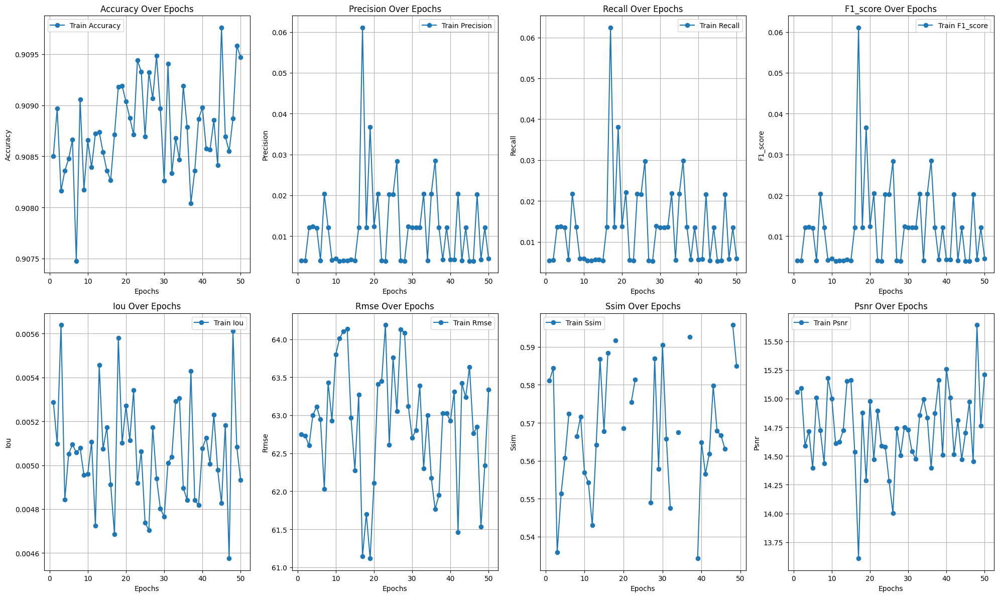

In [ ]:
plot_metrics(train_metrics, epochs=50)

In [ ]:
def evaluate_model(generator, dataset):
    # Initialize metrics and prediction storage
    metrics_agg = {k: [] for k in ['accuracy', 'precision', 'recall', 'f1_score', 'iou', 'rmse', 'ssim', 'psnr']}
    all_predictions = []

    # Iterate over the dataset
    for idx, (image, mask) in enumerate(dataset):
        # Generate predictions for the batch
        predictions = tf.round(generator(image, training=False)).numpy()
        targets = mask.numpy()

        # Store all predictions in a list
        all_predictions.extend(predictions)

        # Compute and aggregate metrics for each image in the batch
        for i, prediction in enumerate(predictions):
            batch_metrics = compute_metrics(targets[i].squeeze(), prediction.squeeze())
            for k, v in batch_metrics.items():
                metrics_agg[k].append(v)

    # Calculate average metrics over the entire dataset
    metrics_avg = {k: np.mean(v) for k, v in metrics_agg.items()}
    print(" Set Metrics:", metrics_avg)

    return metrics_avg, np.array(all_predictions)

In [ ]:
# evaluate model
test_metrics,predictions = evaluate_model(generator, val_dataset)

/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D
/usr/local/lib/python3.10/dist-packages/skimag

 Set Metrics: {'accuracy': 0.891453754471009, 'precision': 0.5742651288845735, 'recall': 0.575004704843646, 'f1_score': 0.5742366329623922, 'iou': 0.002736709763839014, 'rmse': 40.805054, 'ssim': nan, 'psnr': 5.354646309414065}


/usr/local/lib/python3.10/dist-packages/skimage/metrics/_structural_similarity.py:269: RuntimeWarning: invalid value encountered in divide
  S = (A1 * A2) / D


In [ ]:
# Display a few predictions using provided images, masks, and predictions
def display_predictions(images, masks, predictions, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Display the raw input image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(images[i].numpy().squeeze() if isinstance(images[i], tf.Tensor) else images[i].squeeze(), cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        # Display the ground truth mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(masks[i].numpy().squeeze() if isinstance(masks[i], tf.Tensor) else masks[i].squeeze(), cmap="gray")
        plt.title("Ground Truth Mask (GTM)")
        plt.axis("off")

        # Display the predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predictions[i].squeeze(), cmap="gray")
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

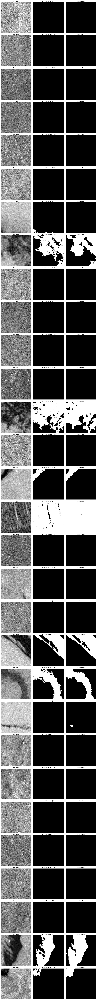

In [ ]:
# Display predictions for validation dataset
display_predictions(val_images, val_masks,predictions, num_samples=30)

In [ ]:
# function to calculate the oil spill size and surface from the predicted ground truth mask
def calculate_oil_spill_size(predicted_mask, pixel_resolution):
    # Threshold the predicted mask to create a binary mask
    binary_mask = (predicted_mask >= 0.5).astype(int)  # 1 = oil spill, 0 = no spill

    # Check if any oil spill pixels are present
    spill_pixel_count = np.sum(binary_mask)
    spill_exists = spill_pixel_count > 0

    # Calculate surface area (spill_pixel_count * pixel_width * pixel_height)
    pixel_width, pixel_height = pixel_resolution
    spill_surface = spill_pixel_count * pixel_width * pixel_height if spill_exists else 0

    return spill_exists, spill_surface

In [ ]:
pixel_resolution = 1.0 , 1.0 # meters
image_index = 60
spill_detected , spill_surface = calculate_oil_spill_size(predictions[image_index].squeeze() , pixel_resolution)
plt.imshow(predictions[image_index].squeeze(), cmap="gray")
plt.title("Predicted Mask")
plt.axis("off")
print(f"Spill Detected: {spill_detected}, Spill Surface: {spill_surface} square meters")

In [ ]:
def save_predictions(output_path, predictions):
    # Save each predicted mask as an image file
    for i, prediction in enumerate(predictions):
        # Define the file path for each mask
        pred_filename = os.path.join(output_path, f"predicted_mask_{i}.png")

        # Convert the mask to 0-255 format for saving as an image
        prediction_img = (prediction.squeeze() * 255).astype(np.uint8)

        # Save the mask as a PNG image
        cv2.imwrite(pred_filename, prediction_img)
        print(f"Saved predicted mask to {pred_filename}")

In [ ]:
# Folder to save predicted masks
output_folder = "/content/drive/MyDrive/FRBS/predicted_masks"
os.makedirs(output_folder, exist_ok=True)

# if satisfied with the results save files
save_predictions(output_folder, predictions)

In [ ]:
# Save the model weights
generator.save_weights(weights_path)
print(f"Model weights saved at: {weights_path}")

Model weights saved at: /content/drive/MyDrive/FRBS/saved_model.weights.h5


---

